### Exploring Credit Risks

This activity is another open exploration of a dataset using both cleaning methods and visualizations.  The data describes customers as good or bad credit risks based on a small set of features specified below.  Your task is to create a Jupyter notebook with an exploration of the data using both your `pandas` cleaning and analysis skills and your visualization skills using `matplotlib`, `seaborn`, and `plotly`.  Your final notebook should be formatted with appropriate headers and markdown cells with written explanations for the code that follows. 

Post your notebook file in Canvas, as well as a brief (3-4 sentence) description of what you found through your analysis. Respond to your peers with reflections on thier analysis. 

-----


##### Data Description

```
1. Status of existing checking account, in Deutsche Mark.
2. Duration in months
3. Credit history (credits taken, paid back duly, delays, critical accounts)
4. Purpose of the credit (car, television,...)
5. Credit amount
6. Status of savings account/bonds, in Deutsche Mark.
7. Present employment, in number of years.
8. Installment rate in percentage of disposable income
9. Personal status (married, single,...) and sex
10. Other debtors / guarantors
11. Present residence since X years
12. Property (e.g. real estate)
13. Age in years
14. Other installment plans (banks, stores)
15. Housing (rent, own,...)
16. Number of existing credits at this bank
17. Job
18. Number of people being liable to provide maintenance for
19. Telephone (yes,no)
20. Foreign worker (yes,no)
```

In [2]:
import pandas as pd

In [3]:
df = pd.read_csv('data/dataset_31_credit-g.csv')

In [4]:
df.head(3)

,checking_status,duration,credit_history,purpose,credit_amount,savings_status,employment,installment_commitment,personal_status,other_parties,...,property_magnitude,age,other_payment_plans,housing,existing_credits,job,num_dependents,own_telephone,foreign_worker,class
0,'<0',6,'critical/other existing credit',radio/tv,1169,'no known savings','>=7',4,'male single',none,...,'real estate',67,none,own,2,skilled,1,yes,yes,good
1,'0<=X<200',48,'existing paid',radio/tv,5951,'<100','1<=X<4',2,'female div/dep/mar',none,...,'real estate',22,none,own,1,skilled,1,none,yes,bad
2,'no checking',12,'critical/other existing credit',education,2096,'<100','4<=X<7',2,'male single',none,...,'real estate',49,none,own,1,'unskilled resident',2,none,yes,good


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   checking_status         1000 non-null   object
 1   duration                1000 non-null   int64 
 2   credit_history          1000 non-null   object
 3   purpose                 1000 non-null   object
 4   credit_amount           1000 non-null   int64 
 5   savings_status          1000 non-null   object
 6   employment              1000 non-null   object
 7   installment_commitment  1000 non-null   int64 
 8   personal_status         1000 non-null   object
 9   other_parties           1000 non-null   object
 10  residence_since         1000 non-null   int64 
 11  property_magnitude      1000 non-null   object
 12  age                     1000 non-null   int64 
 13  other_payment_plans     1000 non-null   object
 14  housing                 1000 non-null   object
 15  exist

In [5]:
df.credit_history.unique()

array(["'critical/other existing credit'", "'existing paid'",
       "'delayed previously'", "'no credits/all paid'", "'all paid'"],
      dtype=object)

In [6]:
df.credit_history.value_counts()

'existing paid'                     530
'critical/other existing credit'    293
'delayed previously'                 88
'all paid'                           49
'no credits/all paid'                40
Name: credit_history, dtype: int64

In [8]:
df.describe()

,duration,credit_amount,installment_commitment,residence_since,age,existing_credits,num_dependents
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,20.903000,3271.258000,2.973000,2.845000,35.546000,1.407000,1.155000
std,12.058814,2822.736876,1.118715,1.103718,11.375469,0.577654,0.362086
min,4.000000,250.000000,1.000000,1.000000,19.000000,1.000000,1.000000
25%,12.000000,1365.500000,2.000000,2.000000,27.000000,1.000000,1.000000
50%,18.000000,2319.500000,3.000000,3.000000,33.000000,1.000000,1.000000
75%,24.000000,3972.250000,4.000000,4.000000,42.000000,2.000000,1.000000
max,72.000000,18424.000000,4.000000,4.000000,75.000000,4.000000,2.000000


In [9]:
df

,checking_status,duration,credit_history,purpose,credit_amount,savings_status,employment,installment_commitment,personal_status,other_parties,...,property_magnitude,age,other_payment_plans,housing,existing_credits,job,num_dependents,own_telephone,foreign_worker,class
0,'<0',6,'critical/other existing credit',radio/tv,1169,'no known savings','>=7',4,'male single',none,...,'real estate',67,none,own,2,skilled,1,yes,yes,good
1,'0<=X<200',48,'existing paid',radio/tv,5951,'<100','1<=X<4',2,'female div/dep/mar',none,...,'real estate',22,none,own,1,skilled,1,none,yes,bad
2,'no checking',12,'critical/other existing credit',education,2096,'<100','4<=X<7',2,'male single',none,...,'real estate',49,none,own,1,'unskilled resident',2,none,yes,good
3,'<0',42,'existing paid',furniture/equipment,7882,'<100','4<=X<7',2,'male single',guarantor,...,'life insurance',45,none,'for free',1,skilled,2,none,yes,good
4,'<0',24,'delayed previously','new car',4870,'<100','1<=X<4',3,'male single',none,...,'no known property',53,none,'for free',2,skilled,2,none,yes,bad
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,'no checking',12,'existing paid',furniture/equipment,1736,'<100','4<=X<7',3,'female div/dep/mar',none,...,'real estate',31,none,own,1,'unskilled resident',1,none,yes,good
996,'<0',30,'existing paid','used car',3857,'<100','1<=X<4',4,'male div/sep',none,...,'life insurance',40,none,own,1,'high qualif/self emp/mgmt',1,yes,yes,good
997,'no checking',12,'existing paid',radio/tv,804,'<100','>=7',4,'male single',none,...,car,38,none,own,1,skilled,1,none,yes,good
998,'<0',45,'existing paid',radio/tv,1845,'<100','1<=X<4',4,'male single',none,...,'no known property',23,none,'for free',1,skilled,1,yes,yes,bad


In [10]:
df.checking_status.value_counts()

'no checking'    394
'<0'             274
'0<=X<200'       269
'>=200'           63
Name: checking_status, dtype: int64

In [11]:
df.savings_status.value_counts()

'<100'                603
'no known savings'    183
'100<=X<500'          103
'500<=X<1000'          63
'>=1000'               48
Name: savings_status, dtype: int64

In [12]:
df.employment.value_counts()

'1<=X<4'      339
'>=7'         253
'4<=X<7'      174
'<1'          172
unemployed     62
Name: employment, dtype: int64

In [13]:
df.personal_status.value_counts()

'male single'           548
'female div/dep/mar'    310
'male mar/wid'           92
'male div/sep'           50
Name: personal_status, dtype: int64

In [14]:
df.credit_history.value_counts()

'existing paid'                     530
'critical/other existing credit'    293
'delayed previously'                 88
'all paid'                           49
'no credits/all paid'                40
Name: credit_history, dtype: int64

In [80]:
df.job.value_counts(normalize = True)

skilled                        0.630
'unskilled resident'           0.200
'high qualif/self emp/mgmt'    0.148
'unemp/unskilled non res'      0.022
Name: job, dtype: float64

In [59]:
df.purpose.value_counts()

radio/tv                280
'new car'               234
furniture/equipment     181
'used car'              103
business                 97
education                50
repairs                  22
'domestic appliance'     12
other                    12
retraining                9
Name: purpose, dtype: int64

In [110]:
df.other_payment_plans.value_counts()

none      814
bank      139
stores     47
Name: other_payment_plans, dtype: int64

In [138]:
df.job.value_counts()

skilled                        630
'unskilled resident'           200
'high qualif/self emp/mgmt'    148
'unemp/unskilled non res'       22
Name: job, dtype: int64

array([[<AxesSubplot:title={'center':'duration'}>,
        <AxesSubplot:title={'center':'credit_amount'}>,
        <AxesSubplot:title={'center':'installment_commitment'}>],
       [<AxesSubplot:title={'center':'residence_since'}>,
        <AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'existing_credits'}>],
       [<AxesSubplot:title={'center':'num_dependents'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

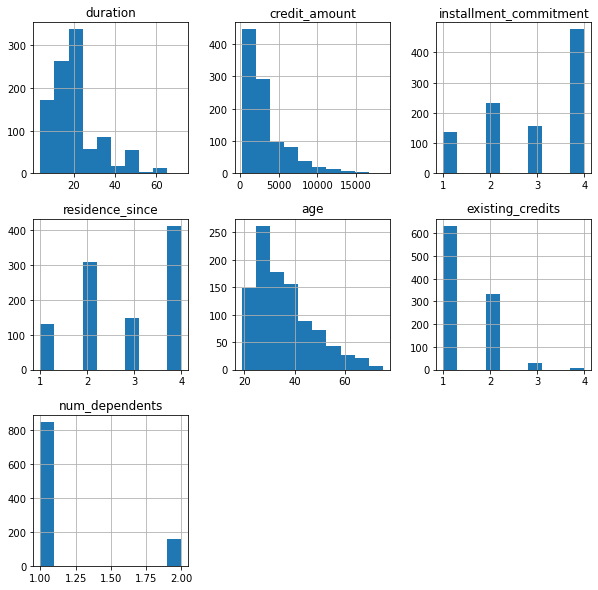

In [81]:
df.hist(figsize=(10,10))

In [20]:
df.corr()

,duration,credit_amount,installment_commitment,residence_since,age,existing_credits,num_dependents
duration,1.000000,0.624984,0.074749,0.034067,-0.036136,-0.011284,-0.023834
credit_amount,0.624984,1.000000,-0.271316,0.028926,0.032716,0.020795,0.017142
installment_commitment,0.074749,-0.271316,1.000000,0.049302,0.058266,0.021669,-0.071207
residence_since,0.034067,0.028926,0.049302,1.000000,0.266419,0.089625,0.042643
age,-0.036136,0.032716,0.058266,0.266419,1.000000,0.149254,0.118201
existing_credits,-0.011284,0.020795,0.021669,0.089625,0.149254,1.000000,0.109667
num_dependents,-0.023834,0.017142,-0.071207,0.042643,0.118201,0.109667,1.000000


In [22]:
df.columns

Index(['checking_status', 'duration', 'credit_history', 'purpose',
       'credit_amount', 'savings_status', 'employment',
       'installment_commitment', 'personal_status', 'other_parties',
       'residence_since', 'property_magnitude', 'age', 'other_payment_plans',
       'housing', 'existing_credits', 'job', 'num_dependents', 'own_telephone',
       'foreign_worker', 'class'],
      dtype='object')

In [5]:
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

<AxesSubplot:ylabel='Count'>

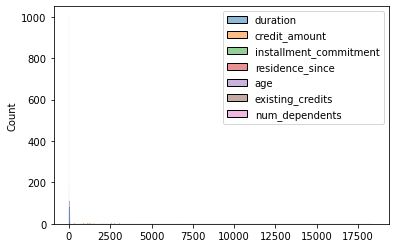

In [19]:
sns.histplot(df)

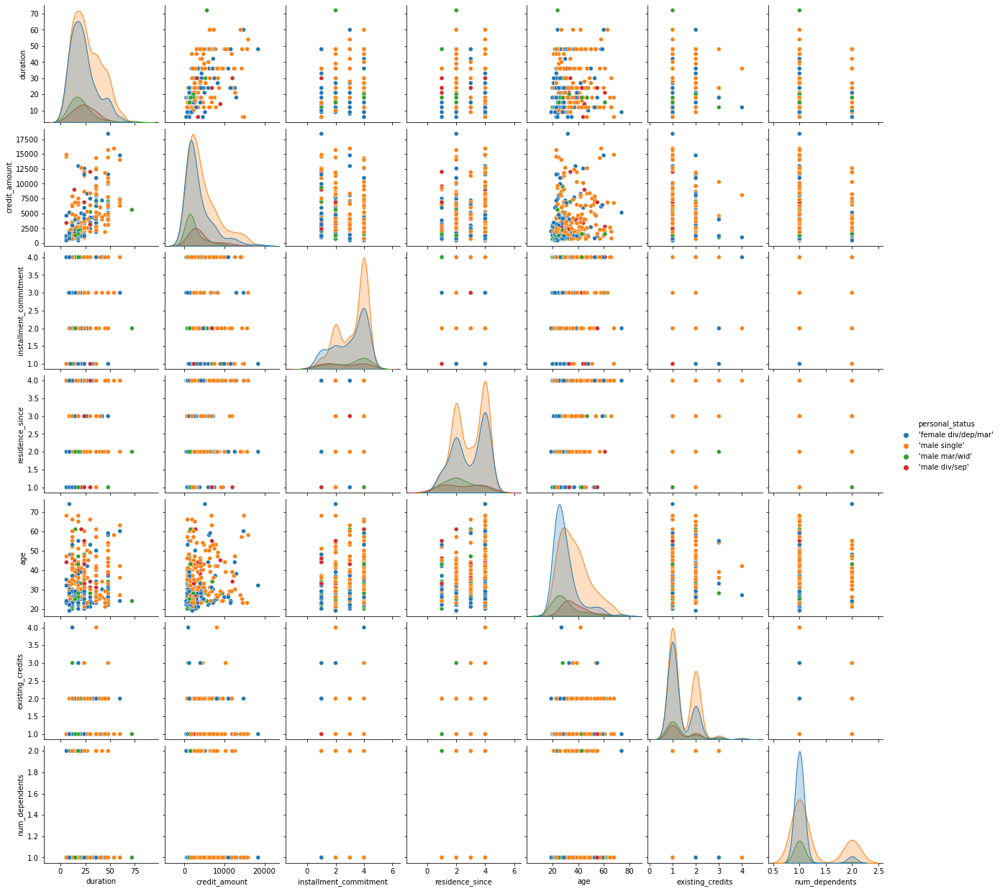

In [31]:
sns.pairplot(df[df['class'] == 'bad'], hue = 'personal_status')

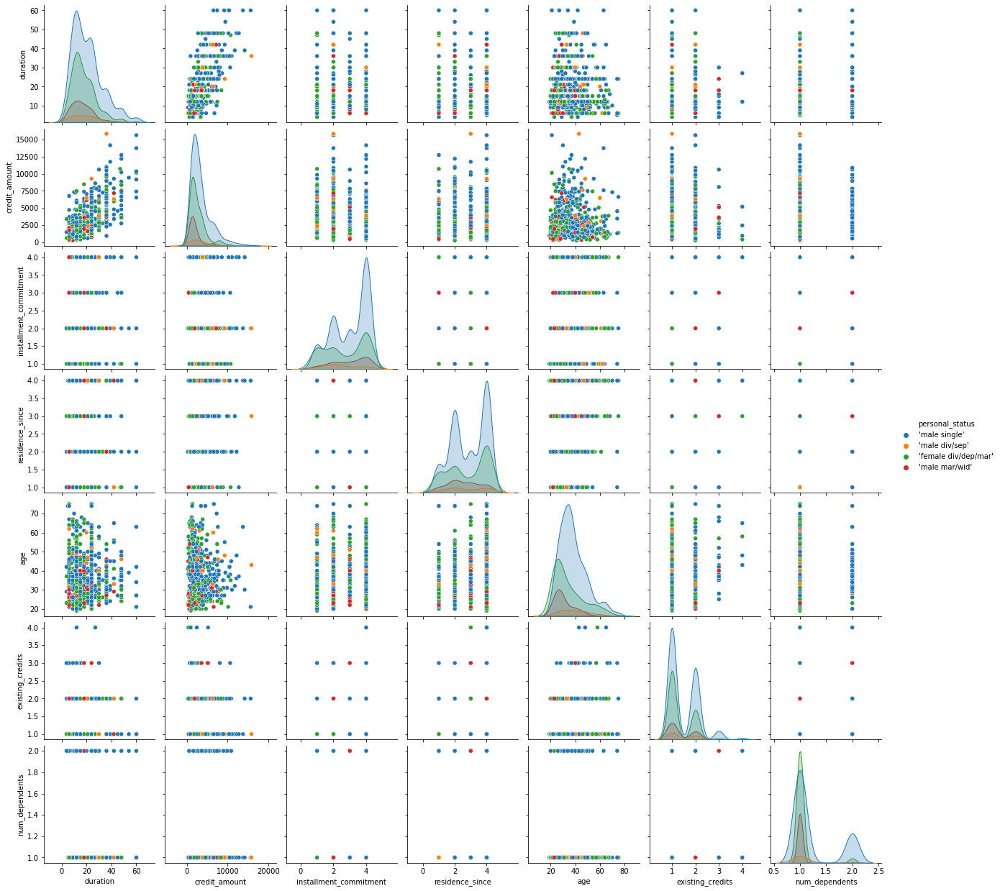

In [32]:
sns.pairplot(df[df['class'] == 'good'], hue = 'personal_status')

<AxesSubplot:>

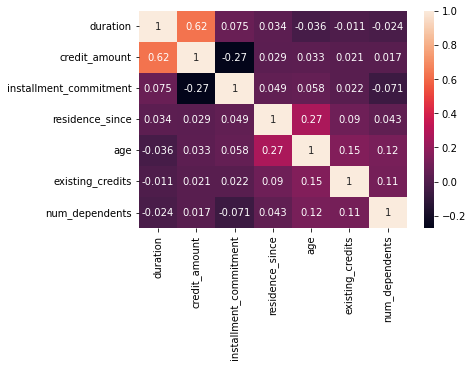

In [27]:
sns.heatmap(df.corr(), annot=True)

<AxesSubplot:>

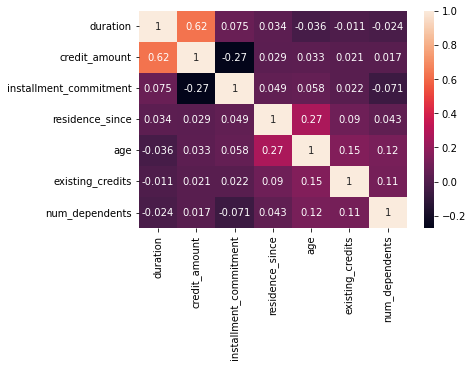

In [26]:
sns.heatmap(df[['duration', 'credit_amount', 'installment_commitment', 'residence_since', 'age', 'existing_credits','num_dependents']].corr(), annot=True)

In [ ]:
df[['duration', 'credit_amount', 'installment_commitment', 'age']]

In [33]:
df[df['class'] == 'bad'].checking_status.value_counts()

'<0'             135
'0<=X<200'       105
'no checking'     46
'>=200'           14
Name: checking_status, dtype: int64

In [34]:
df[df['class'] == 'bad'].savings_status.value_counts()

'<100'                217
'100<=X<500'           34
'no known savings'     32
'500<=X<1000'          11
'>=1000'                6
Name: savings_status, dtype: int64

In [111]:
df[df['class'] == 'bad'].other_payment_plans.value_counts()

none      224
bank       57
stores     19
Name: other_payment_plans, dtype: int64

<AxesSubplot:xlabel='checking_status', ylabel='Count'>

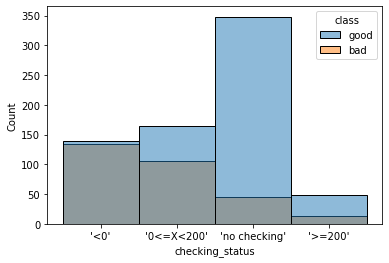

In [44]:
# what is common among folks with bad credit
sns.histplot(df, x='checking_status', hue='class')
#sns.histplot(df, x='savings_status', hue='class')


<AxesSubplot:xlabel='class', ylabel='Count'>

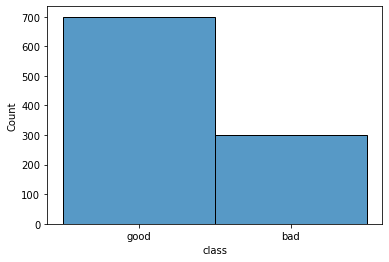

In [62]:
# what is common among folks with bad credit
sns.histplot(df, x='class')
#sns.histplot(df, x='savings_status', hue='class')

<AxesSubplot:xlabel='credit_amount', ylabel='Count'>

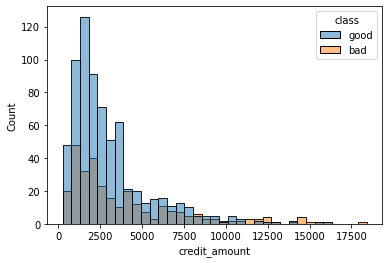

In [46]:
sns.histplot(df, x='credit_amount', hue='class')

<AxesSubplot:xlabel='age', ylabel='Count'>

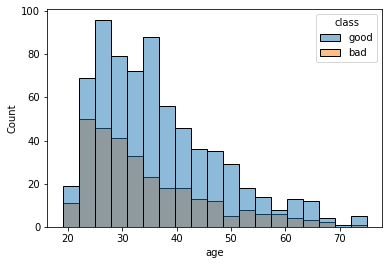

In [51]:
sns.histplot(df, x='age', hue='class')

<AxesSubplot:xlabel='duration', ylabel='Count'>

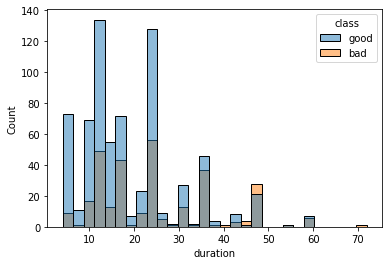

In [52]:
sns.histplot(df, x='duration', hue='class')

<AxesSubplot:xlabel='installment_commitment', ylabel='Count'>

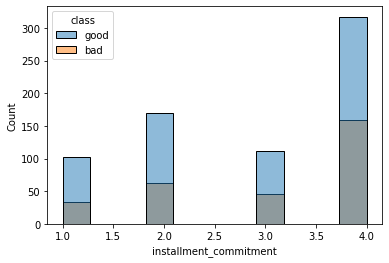

In [57]:
sns.histplot(df, x='installment_commitment', hue='class')

<AxesSubplot:xlabel='num_dependents', ylabel='Count'>

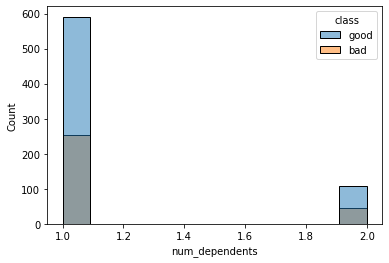

In [54]:
sns.histplot(df, x='num_dependents', hue='class')

<AxesSubplot:xlabel='existing_credits', ylabel='Count'>

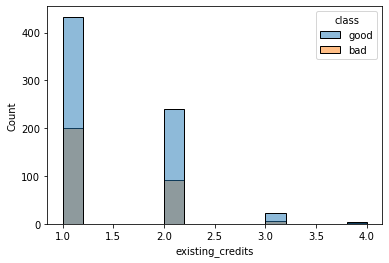

In [55]:
sns.histplot(df, x='existing_credits', hue='class')

<AxesSubplot:xlabel='residence_since', ylabel='Count'>

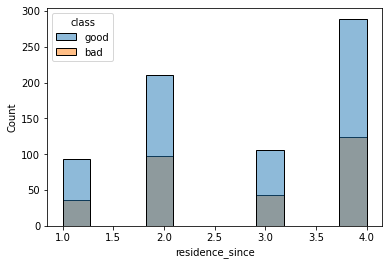

In [56]:
sns.histplot(df, x='residence_since', hue='class')

In [61]:
px.histogram(df, x='purpose', color='class', barmode='group')

In [58]:
px.histogram(df, x='job', color='class', barmode='group')

In [49]:
px.histogram(df, x='credit_amount', color='class', barmode='group')

In [45]:
px.histogram(df, x=['checking_status','savings_status'], color='class', barmode='group', text_auto=True)

# Transform Dataset

In [6]:
credit = df.rename(columns = {'class':'rating'})


In [7]:
credit.loc[credit['rating'] == 'good', 'rating'] = 1
credit.loc[credit['rating'] == 'bad', 'rating'] = 0
credit['rating'] = pd.to_numeric(credit['rating'])

In [8]:
credit['personal_status'] = credit['personal_status'].str.replace("'","")

In [9]:
credit['gender'] = credit['personal_status'].str.split().str[0]

In [10]:
credit.loc[credit['gender'] == 'male', 'gender'] = 1
credit.loc[credit['gender'] == 'female', 'gender'] = 0
credit['gender'] = pd.to_numeric(credit['gender'])

In [11]:
credit.describe()

,duration,credit_amount,installment_commitment,residence_since,age,existing_credits,num_dependents,rating,gender
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,20.903000,3271.258000,2.973000,2.845000,35.546000,1.407000,1.155000,0.700000,0.690000
std,12.058814,2822.736876,1.118715,1.103718,11.375469,0.577654,0.362086,0.458487,0.462725
min,4.000000,250.000000,1.000000,1.000000,19.000000,1.000000,1.000000,0.000000,0.000000
25%,12.000000,1365.500000,2.000000,2.000000,27.000000,1.000000,1.000000,0.000000,0.000000
50%,18.000000,2319.500000,3.000000,3.000000,33.000000,1.000000,1.000000,1.000000,1.000000
75%,24.000000,3972.250000,4.000000,4.000000,42.000000,2.000000,1.000000,1.000000,1.000000
max,72.000000,18424.000000,4.000000,4.000000,75.000000,4.000000,2.000000,1.000000,1.000000


In [12]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   checking_status         1000 non-null   object
 1   duration                1000 non-null   int64 
 2   credit_history          1000 non-null   object
 3   purpose                 1000 non-null   object
 4   credit_amount           1000 non-null   int64 
 5   savings_status          1000 non-null   object
 6   employment              1000 non-null   object
 7   installment_commitment  1000 non-null   int64 
 8   personal_status         1000 non-null   object
 9   other_parties           1000 non-null   object
 10  residence_since         1000 non-null   int64 
 11  property_magnitude      1000 non-null   object
 12  age                     1000 non-null   int64 
 13  other_payment_plans     1000 non-null   object
 14  housing                 1000 non-null   object
 15  exist

array([[<AxesSubplot:title={'center':'duration'}>,
        <AxesSubplot:title={'center':'credit_amount'}>,
        <AxesSubplot:title={'center':'installment_commitment'}>],
       [<AxesSubplot:title={'center':'residence_since'}>,
        <AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'existing_credits'}>],
       [<AxesSubplot:title={'center':'num_dependents'}>,
        <AxesSubplot:title={'center':'rating'}>,
        <AxesSubplot:title={'center':'gender'}>]], dtype=object)

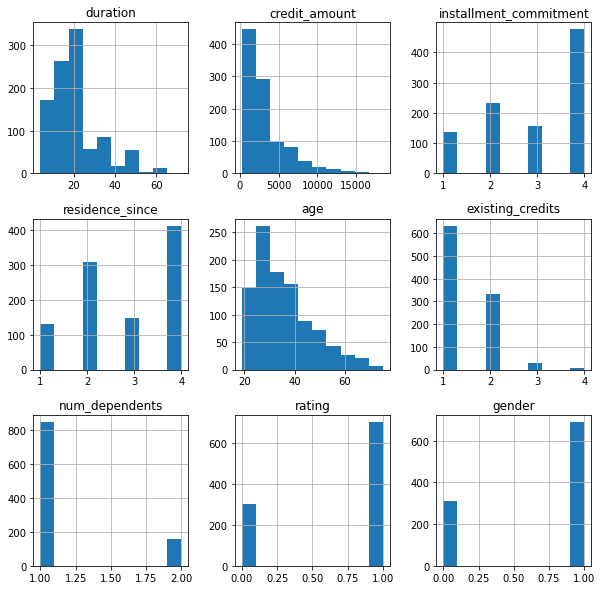

In [12]:
credit.hist(figsize=(10,10))

<AxesSubplot:xlabel='gender', ylabel='Count'>

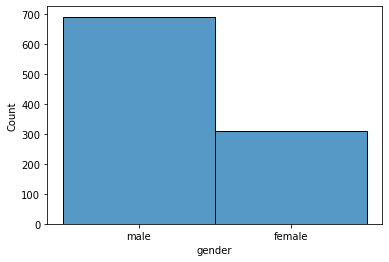

In [103]:
# what is common among folks with bad credit
sns.histplot(credit, x='gender')

<AxesSubplot:xlabel='rating', ylabel='Count'>

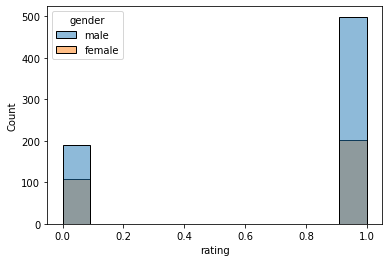

In [107]:
sns.histplot(credit, x='rating', hue='gender')

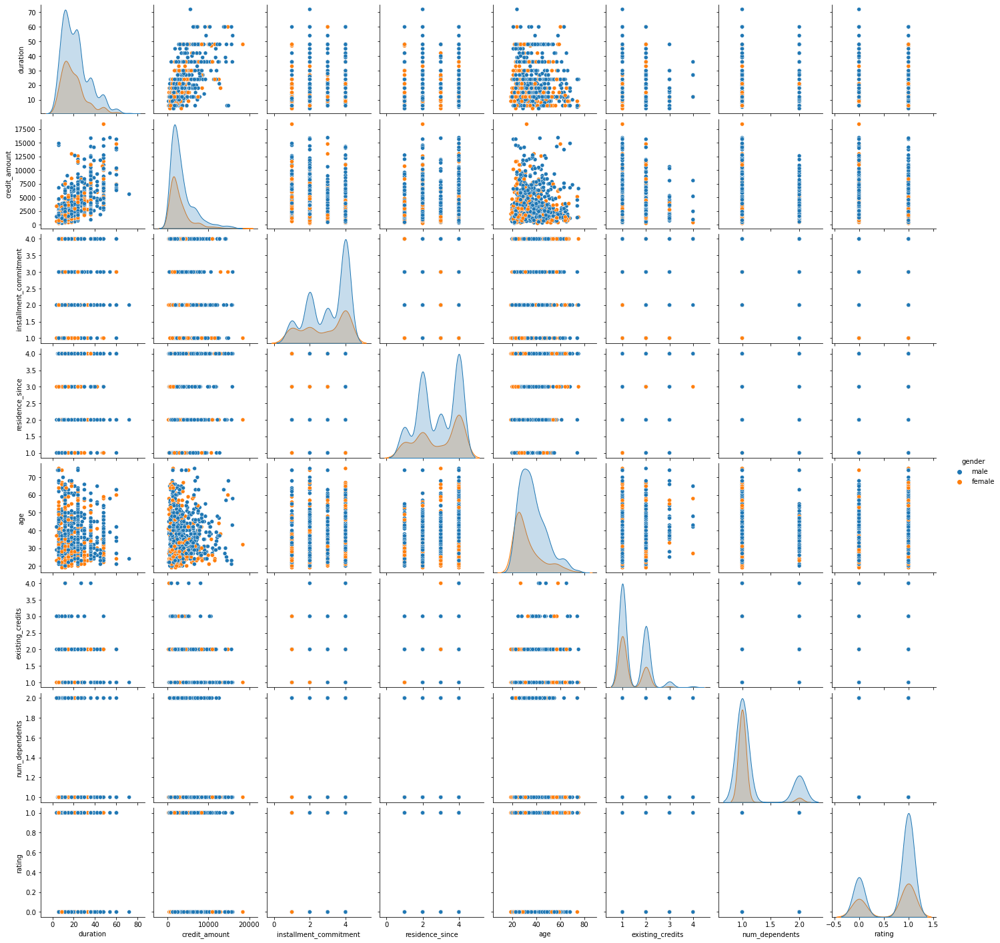

In [109]:
sns.pairplot(credit, hue='gender')

In [149]:
credit

,checking_status,duration,credit_history,purpose,credit_amount,savings_status,employment,installment_commitment,personal_status,other_parties,...,existing_credits,job,num_dependents,own_telephone,foreign_worker,rating,gender,employment_year,savings,checking
0,'<0',6,'critical/other existing credit',radio/tv,1169,'no known savings','>=7',4,male single,0,...,2,skilled,1,1,1,1,1,9.0,0.0,0.0
1,'0<=X<200',48,'existing paid',radio/tv,5951,'<100','1<=X<4',2,female div/dep/mar,0,...,1,skilled,1,0,1,0,0,3.0,1.0,1.0
2,'no checking',12,'critical/other existing credit',education,2096,'<100','4<=X<7',2,male single,0,...,1,'unskilled resident',2,0,1,1,1,6.0,1.0,0.0
3,'<0',42,'existing paid',furniture/equipment,7882,'<100','4<=X<7',2,male single,1,...,1,skilled,2,0,1,1,1,6.0,1.0,0.0
4,'<0',24,'delayed previously','new car',4870,'<100','1<=X<4',3,male single,0,...,2,skilled,2,0,1,0,1,3.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,'no checking',12,'existing paid',furniture/equipment,1736,'<100','4<=X<7',3,female div/dep/mar,0,...,1,'unskilled resident',1,0,1,1,0,6.0,1.0,0.0
996,'<0',30,'existing paid','used car',3857,'<100','1<=X<4',4,male div/sep,0,...,1,'high qualif/self emp/mgmt',1,1,1,1,1,3.0,1.0,0.0
997,'no checking',12,'existing paid',radio/tv,804,'<100','>=7',4,male single,0,...,1,skilled,1,0,1,1,1,9.0,1.0,0.0
998,'<0',45,'existing paid',radio/tv,1845,'<100','1<=X<4',4,male single,0,...,1,skilled,1,1,1,0,1,3.0,1.0,0.0


In [13]:
credit.own_telephone.value_counts()

none    596
yes     404
Name: own_telephone, dtype: int64

In [11]:
credit.loc[credit['own_telephone'] == 'yes', 'own_telephone'] = 1
credit.loc[credit['own_telephone'] == 'none', 'own_telephone'] = 0
credit['own_telephone'] = pd.to_numeric(credit['own_telephone'])

In [12]:
credit.foreign_worker.value_counts()

yes    963
no      37
Name: foreign_worker, dtype: int64

In [13]:
credit.loc[credit['foreign_worker'] == 'yes', 'foreign_worker'] = 1
credit.loc[credit['foreign_worker'] == 'no', 'foreign_worker'] = 0
credit['foreign_worker'] = pd.to_numeric(credit['foreign_worker'])

In [14]:
credit.other_parties.value_counts()

none              907
guarantor          52
'co applicant'     41
Name: other_parties, dtype: int64

In [15]:
credit.loc[credit['other_parties'] == "'co applicant'", 'other_parties'] = 1
credit.loc[credit['other_parties'] == 'guarantor', 'other_parties'] = 1
credit.loc[credit['other_parties'] == 'none', 'other_parties'] = 0
credit['other_parties'] = pd.to_numeric(credit['other_parties'])

In [30]:
credit[['duration', 'credit_history', 'installment_commitment', 'age', 'existing_credits', 'own_telephone',
       'foreign_worker', 'rating', 'gender', 'employment_year', 'savings', 'checking', 'history']].corr()

,duration,installment_commitment,age,existing_credits,own_telephone,foreign_worker,rating,gender,employment_year,savings,checking,history
duration,1.000000,0.074749,-0.036136,-0.011284,0.164718,0.138196,-0.214927,0.081432,0.058855,-0.064526,0.004163,-0.166494
installment_commitment,0.074749,1.000000,0.058266,0.021669,0.014413,0.090024,-0.072404,0.086302,0.131571,-0.000805,-0.071553,0.013599
age,-0.036136,0.058266,1.000000,0.149254,0.145259,0.006151,0.091127,0.161694,0.299241,-0.017997,-0.027176,-0.069791
existing_credits,-0.011284,0.021669,0.149254,1.000000,0.065553,0.009717,0.045732,0.094260,0.138027,-0.004176,-0.071000,-0.336279
own_telephone,0.164718,0.014413,0.145259,0.065553,1.000000,0.107401,0.036466,0.075966,0.081364,-0.037452,-0.012076,-0.051950
foreign_worker,0.138196,0.090024,0.006151,0.009717,0.107401,1.000000,-0.082079,-0.051202,0.039023,-0.005318,0.014162,-0.042783
rating,-0.214927,-0.072404,0.091127,0.045732,0.036466,-0.082079,1.000000,0.075493,0.113157,0.033871,-0.052375,0.060511
gender,0.081432,0.086302,0.161694,0.094260,0.075966,-0.051202,0.075493,1.000000,0.199240,-0.029310,-0.012705,-0.095878
employment_year,0.058855,0.131571,0.299241,0.138027,0.081364,0.039023,0.113157,0.199240,1.000000,0.003699,-0.073279,-0.032181
savings,-0.064526,-0.000805,-0.017997,-0.004176,-0.037452,-0.005318,0.033871,-0.029310,0.003699,1.000000,0.025607,-0.010964


<AxesSubplot:>

<Figure size 432x288 with 0 Axes>

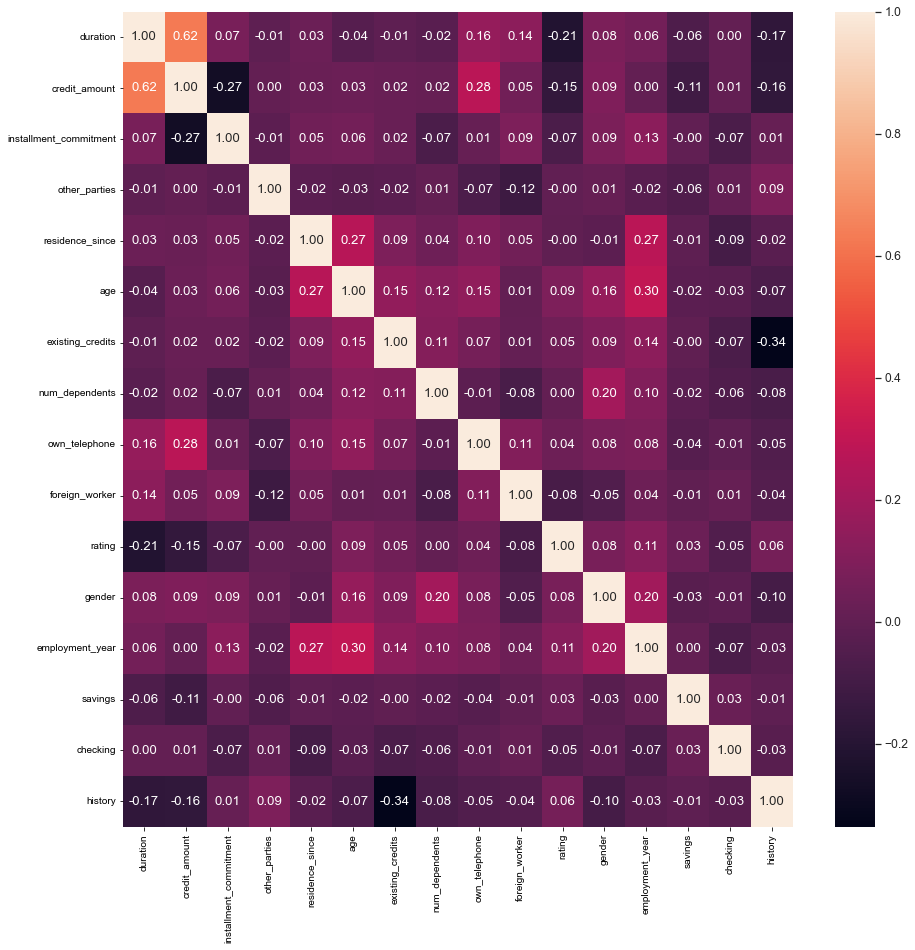

In [37]:
plt.tight_layout()
plt.subplots(figsize=(15,15))

sns.set(font_scale=1.1)
sns.heatmap(credit.corr(), annot=True, fmt='.2f')

<AxesSubplot:>

<Figure size 432x288 with 0 Axes>

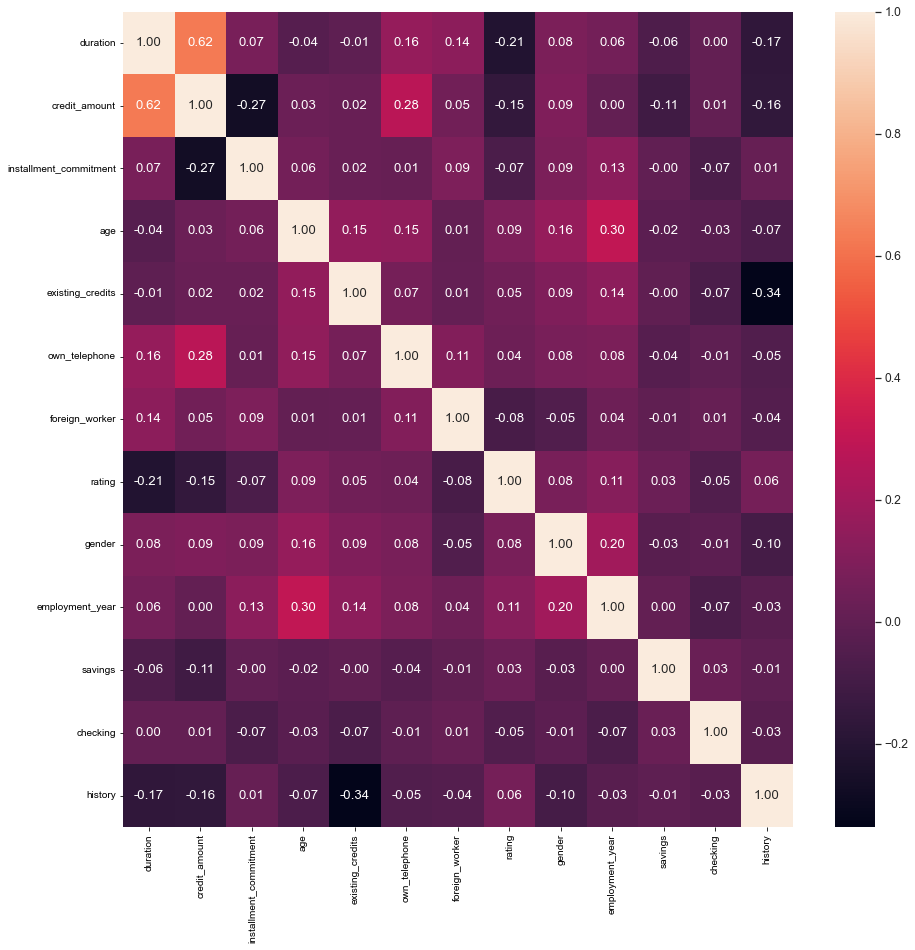

In [29]:
plt.tight_layout()
plt.subplots(figsize=(15,15))

sns.set(font_scale=1.1)
sns.heatmap(credit[['duration', 'credit_amount', 'installment_commitment', 'age', 'existing_credits', 'own_telephone',
       'foreign_worker', 'rating', 'gender', 'employment_year', 'savings', 'checking', 'history']].corr(), annot=True, fmt='.2f')

In [21]:
credit.credit_history.value_counts()

'existing paid'                     530
'critical/other existing credit'    293
'delayed previously'                 88
'all paid'                           49
'no credits/all paid'                40
Name: credit_history, dtype: int64

In [22]:
credit.employment.value_counts()

'1<=X<4'      339
'>=7'         253
'4<=X<7'      174
'<1'          172
unemployed     62
Name: employment, dtype: int64

In [23]:
credit.checking_status.value_counts()

'no checking'    394
'<0'             274
'0<=X<200'       269
'>=200'           63
Name: checking_status, dtype: int64

In [24]:
credit.savings_status.value_counts()

'<100'                603
'no known savings'    183
'100<=X<500'          103
'500<=X<1000'          63
'>=1000'               48
Name: savings_status, dtype: int64

In [16]:
credit.loc[credit['employment'] == "unemployed", 'employment_year'] = 0
credit.loc[credit['employment'] == "'<1'", 'employment_year'] = 1
credit.loc[credit['employment'] == "'1<=X<4'", 'employment_year'] = 3
credit.loc[credit['employment'] == "'4<=X<7'", 'employment_year'] = 6
credit.loc[credit['employment'] == "'>=7'", 'employment_year'] = 9

In [17]:
credit.loc[credit['savings_status'] == "'no known savings'", 'savings'] = 0
credit.loc[credit['savings_status'] == "'<100'", 'savings'] = 1
credit.loc[credit['savings_status'] == "'100<=X<500'", 'savings'] = 2
credit.loc[credit['savings_status'] == "'500<=X<1000'", 'savings'] = 3
credit.loc[credit['savings_status'] == "'>=1000'", 'savings'] = 4

In [18]:
credit.loc[credit['checking_status'] == "'no checking'", 'checking'] = 0
credit.loc[credit['checking_status'] == "'<0'", 'checking'] = 0
credit.loc[credit['checking_status'] == "'0<=X<200'", 'checking'] = 1
credit.loc[credit['checking_status'] == "'>=200'", 'checking'] = 2

In [19]:
credit.loc[credit['credit_history'] == "'existing paid'", 'history'] = 4
credit.loc[credit['credit_history'] == "'critical/other existing credit'", 'history'] = 3
credit.loc[credit['credit_history'] == "'delayed previously'", 'history'] = 0
credit.loc[credit['credit_history'] == "'all paid'", 'history'] = 2
credit.loc[credit['credit_history'] == "'no credits/all paid'", 'history'] = 1

In [29]:
credit[credit['rating'] == 0].credit_history.value_counts()

'existing paid'                     169
'critical/other existing credit'     50
'delayed previously'                 28
'all paid'                           28
'no credits/all paid'                25
Name: credit_history, dtype: int64

In [31]:
credit[credit['rating'] == 0].purpose.value_counts()

'new car'               89
radio/tv                62
furniture/equipment     58
business                34
education               22
'used car'              17
repairs                  8
other                    5
'domestic appliance'     4
retraining               1
Name: purpose, dtype: int64

In [23]:
credit[credit['rating'] == 1].purpose.value_counts()

radio/tv                218
'new car'               145
furniture/equipment     123
'used car'               86
business                 63
education                28
repairs                  14
'domestic appliance'      8
retraining                8
other                     7
Name: purpose, dtype: int64

In [24]:
credit.purpose.value_counts()

radio/tv                280
'new car'               234
furniture/equipment     181
'used car'              103
business                 97
education                50
repairs                  22
'domestic appliance'     12
other                    12
retraining                9
Name: purpose, dtype: int64

In [32]:
credit.columns

Index(['checking_status', 'duration', 'credit_history', 'purpose',
       'credit_amount', 'savings_status', 'employment',
       'installment_commitment', 'personal_status', 'other_parties',
       'residence_since', 'property_magnitude', 'age', 'other_payment_plans',
       'housing', 'existing_credits', 'job', 'num_dependents', 'own_telephone',
       'foreign_worker', 'rating', 'gender', 'employment_year', 'savings',
       'checking', 'history'],
      dtype='object')

In [35]:
px.histogram(credit, x='credit_amount', color='rating', text_auto=True)

In [179]:
px.histogram(credit, x='duration', color='rating')

<AxesSubplot:xlabel='duration', ylabel='Count'>

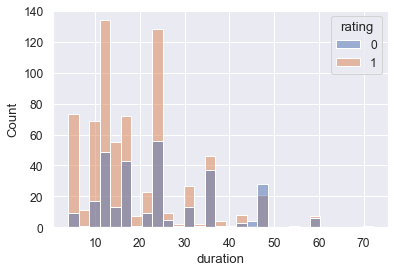

In [174]:
sns.histplot(credit, x='duration', hue='rating')

In [184]:
import numpy as np

<AxesSubplot:xlabel='duration', ylabel='rating'>

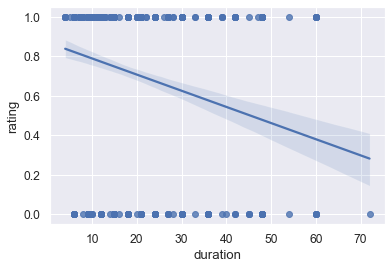

In [181]:
sns.regplot(data=credit, x='duration', y='rating')

<AxesSubplot:xlabel='credit_amount', ylabel='rating'>

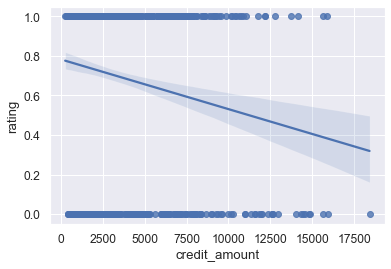

In [186]:
sns.regplot(data=credit, x='credit_amount', y='rating')

<AxesSubplot:xlabel='employment_year', ylabel='rating'>

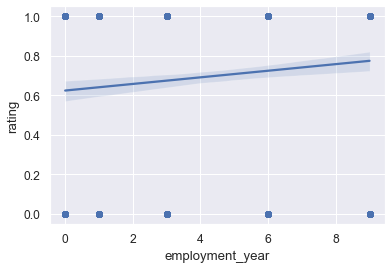

In [187]:
sns.regplot(data=credit, x='employment_year', y='rating')

In [197]:
credit.groupby('rating')[['duration','credit_amount']].agg(['mean','median','max','min','count'])

duration                      credit_amount                          
             mean median max min count          mean  median    max  min count
rating                                                                        
0       24.860000   24.0  72   6   300   3938.126667  2574.5  18424  433   300
1       19.207143   18.0  60   4   700   2985.457143  2244.0  15857  250   700

In [257]:
fig = px.violin(credit[['credit_amount','rating']], color='rating', title='Credit Amount by Credit Rating', labels={"variable":"Credit Amount", "value":"$", "rating":"Credit Rating"})
fig.write_html('../discussions/images/credit_amount.html')
fig.show()

In [258]:
fig = px.violin(credit[['duration','employment_year','rating']], color='rating', title='Credit and Employment Duration by Credit Rating', labels={"variable":"Loan and Employment Duration", "value":"Time", "rating":"Credit Rating", "duration":"Loan Duration", "employment_year":"Employment Duration"})
fig.write_html('../discussions/images/durations.html')
fig.show()

<AxesSubplot:ylabel='rating'>

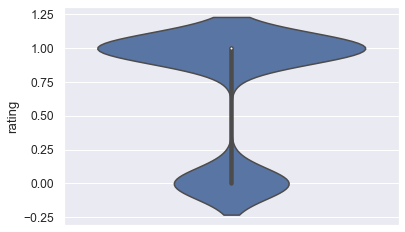

In [206]:
sns.violinplot(data=credit[['duration','employment_year','rating']], y='rating', hue='rating')

In [32]:
credit[(credit['duration'] > 42) & (credit['employment_year'] < 6) & (credit['credit_amount'] > 2574.5)].rating.value_counts(normalize=True)

0    0.588235
1    0.411765
Name: rating, dtype: float64

In [251]:
credit.rating.value_counts(normalize=True)

1    0.7
0    0.3
Name: rating, dtype: float64

In [36]:
credit[(credit['duration'] > 42) & (credit['employment_year'] < 6) & (credit['credit_amount'] > 2574.5)].rating.value_counts()

0    20
1    14
Name: rating, dtype: int64

<AxesSubplot:>

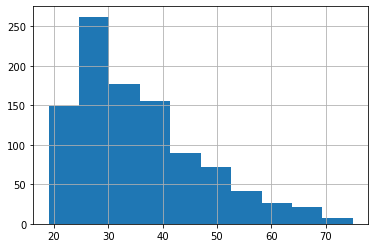

In [26]:
credit['age'].hist()

In [20]:
px.histogram(credit, x='age', y='credit_amount', color='rating')

In [24]:
credit.groupby('employment').mean()['credit_amount'].sort_values()

employment
'<1'          2952.453488
'1<=X<4'      3125.286136
'>=7'         3224.624506
'4<=X<7'      3601.695402
unemployed    4216.758065
Name: credit_amount, dtype: float64

In [160]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   checking_status         1000 non-null   object 
 1   duration                1000 non-null   int64  
 2   credit_history          1000 non-null   object 
 3   purpose                 1000 non-null   object 
 4   credit_amount           1000 non-null   int64  
 5   savings_status          1000 non-null   object 
 6   employment              1000 non-null   object 
 7   installment_commitment  1000 non-null   int64  
 8   personal_status         1000 non-null   object 
 9   other_parties           1000 non-null   int64  
 10  residence_since         1000 non-null   int64  
 11  property_magnitude      1000 non-null   object 
 12  age                     1000 non-null   int64  
 13  other_payment_plans     1000 non-null   object 
 14  housing                 1000 non-null   o